In [ ]:
%pip install ultralytics opencv-python requests
#Installing required dependencies

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 17.7 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import cv2
import requests
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt  #Importing required libraries and tools

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
from google.colab import drive #Accessing Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
model = YOLO('/content/drive/MyDrive/CV_Project/CV_Project/weights/best.pt')  #Getting the custom model from Google Drive

class_names = model.names #Getting class names

print(class_names)

{0: 'fire', 1: 'nofire'}


In [ ]:
video1_nofire = {'url':'https://www.pexels.com/es-es/download/video/33968796/','path':'video1_nofire.mp4'}   #Defining sample videos
video2_fire = {'url':'https://www.pexels.com/es-es/download/video/4825783/','path':'video2_fire.mp4'}
video3_fire = {'url':'https://www.pexels.com/es-es/download/video/29719119/','path':'video3_fire.mp4'}

videos = [video1_nofire, video2_fire, video3_fire]


for video in videos: #Downloading sample videos
  response = requests.get(video['url'], stream = True)
  with open(video['path'], 'wb') as f:
    for chunk in response.iter_content(chunk_size=1024*1024):
      if chunk:
         f.write(chunk)

In [ ]:
token = 'token'   #Connecting and testing the Telegram Bot
chat_id = 'chat id'
text = 'Fire detected'

request = requests.post(
    f'https://api.telegram.org/bot{token}/sendMessage',
    json={
        'chat_id': chat_id,
        'text': text
    }
    )


In [ ]:
text_1 = 'URGENT: Manual Verification Required - Potential Fire Activity Detected\nOur automated fire monitoring system has identified suspicious activity. The current detection confidence level is below 50%. Per safety protocols, this event requires immediate human verification to determine the nature of the activity.'

text_2 = 'CRITICAL PRIORITY: High-Confidence Fire Detection - Emergency Protocols Required\nThe fire detection system has identified a high-probability fire event. This event has reached a critical threshold. Immediate human verification is mandatory. If the fire is visible or confirmed via remote monitoring, please contact emergency services and local authorities immediately.'

text_3 = 'EMERGENCY: Fire Confirmed - Automated Dispatch Initiated\nCRITICAL INCIDENT ALERT - LEVEL: MAXIMUM\nEmergency services and local fire authorities have been automatically notified and are currently en route to the facility.\nIMMEDIATE INSTRUCTIONS:\n-Evacuate all personnel from the affected zone immediately.\n-Prepare to meet emergency responders at the designated arrival point.'

#Creating the text samples that the Agent is going to use when sending messages

In [ ]:
def send_alert(confidence): #creating the function that sends messages through the Telegram API based on threshlods
  if confidence < 0.5:
    request_send_alert = requests.post(f'https://api.telegram.org/bot{token}/sendMessage', json={'chat_id': chat_id, 'text': text_1})
  elif 0.5 <= confidence < 0.8:
    request_send_alert = requests.post(f'https://api.telegram.org/bot{token}/sendMessage', json={'chat_id': chat_id, 'text': text_2})
  else:
    request_send_alert = requests.post(f'https://api.telegram.org/bot{token}/sendMessage', json={'chat_id': chat_id, 'text': text_3})



In [ ]:
def predict_video(video_path): #Agent that gets the sample videos and calls the model to determine whether there is or not fire on the sample video, then calling the send_alert function.
  cap = cv2.VideoCapture(video_path)
  fps = cap.get(cv2.CAP_PROP_FPS)

  frame_count = 0
  fire_count = 0
  while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
      break

#Analyzing a frame per second
    if frame_count % int(fps) == 0:
      results = model.predict(frame)
      class_list = results[0].probs.top1
      confidence = results[0].probs.top1conf

      if class_names[class_list] == 'fire':
        if confidence < 0.5:
          print('Fire detected but im not sure')
        elif 0.5 <= confidence < 0.8:
          print('Very sure it is fire')
        else:
          print('Sure it is fire')
#Displaying the detected frame.
        cv2.putText(frame, f'Class: {class_names[class_list]} Confidence: {confidence:.2f}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)

        img = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.imshow(img)
        plt.axis('off')
        plt.show()

#Sending the alert
        fire_count += 1
        if fire_count >= 5:
         send_alert(confidence)
         fire_count = 0

    frame_count += 1

  cap.release()






0: 224x224 fire 0.73, nofire 0.27, 18.0ms
Speed: 25.4ms preprocess, 18.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Very sure it is fire


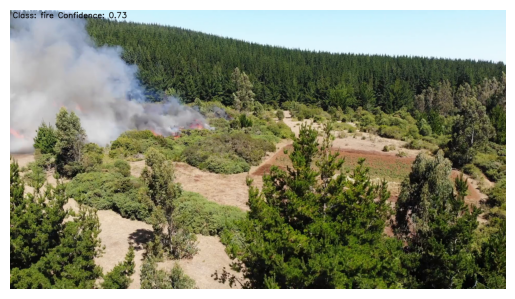


0: 224x224 fire 0.91, nofire 0.09, 22.8ms
Speed: 24.1ms preprocess, 22.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


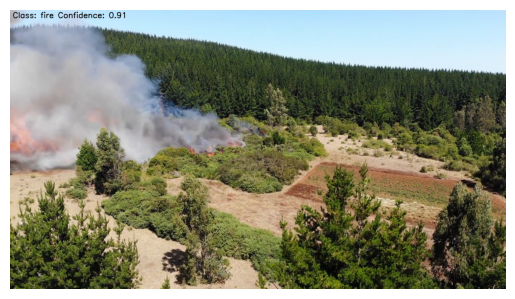


0: 224x224 fire 0.99, nofire 0.01, 16.8ms
Speed: 35.8ms preprocess, 16.8ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


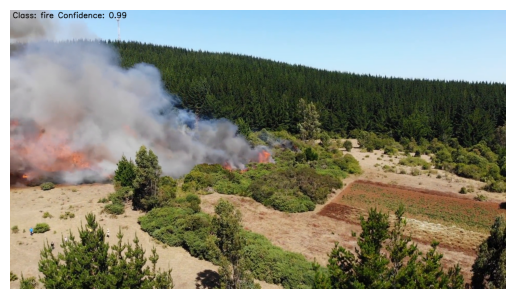


0: 224x224 fire 1.00, nofire 0.00, 20.1ms
Speed: 40.9ms preprocess, 20.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


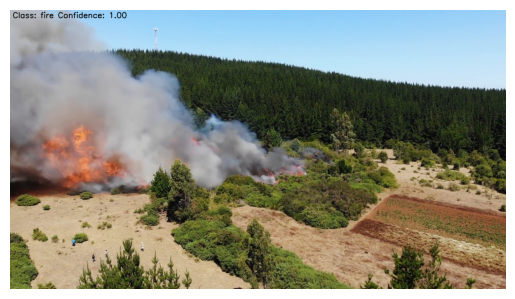


0: 224x224 fire 1.00, nofire 0.00, 16.5ms
Speed: 37.3ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


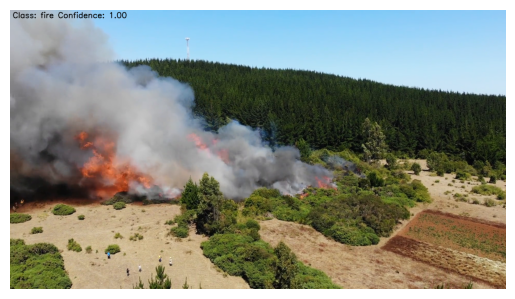


0: 224x224 fire 1.00, nofire 0.00, 17.5ms
Speed: 34.7ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


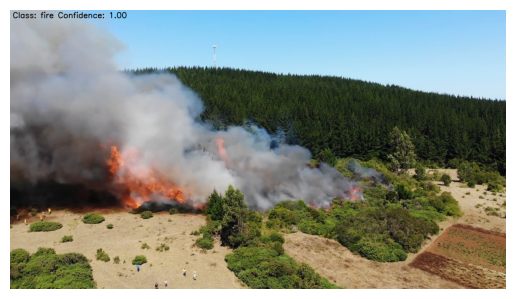


0: 224x224 fire 1.00, nofire 0.00, 18.9ms
Speed: 39.4ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


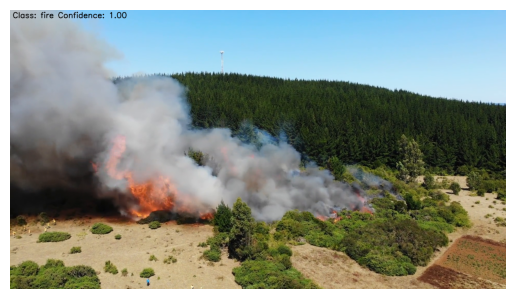


0: 224x224 fire 1.00, nofire 0.00, 19.1ms
Speed: 36.8ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


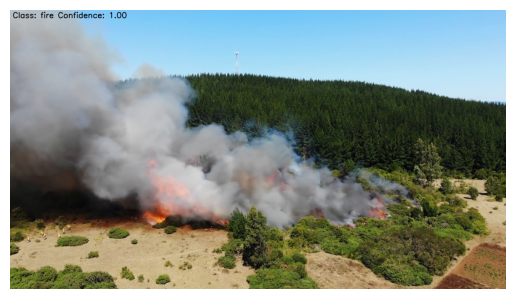


0: 224x224 fire 1.00, nofire 0.00, 21.6ms
Speed: 37.1ms preprocess, 21.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


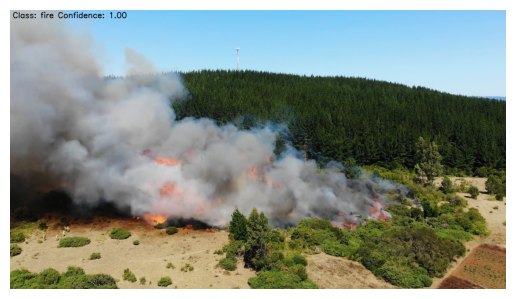


0: 224x224 fire 1.00, nofire 0.00, 25.3ms
Speed: 34.7ms preprocess, 25.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


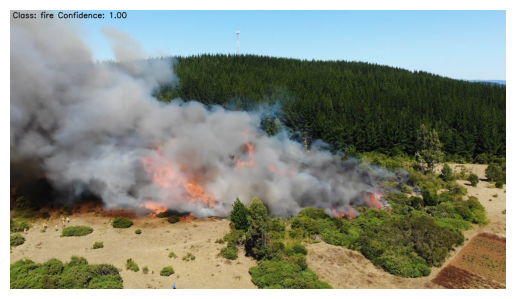


0: 224x224 fire 1.00, nofire 0.00, 27.8ms
Speed: 87.9ms preprocess, 27.8ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


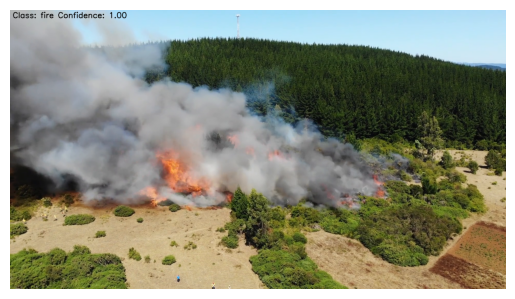


0: 224x224 fire 1.00, nofire 0.00, 28.3ms
Speed: 36.5ms preprocess, 28.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


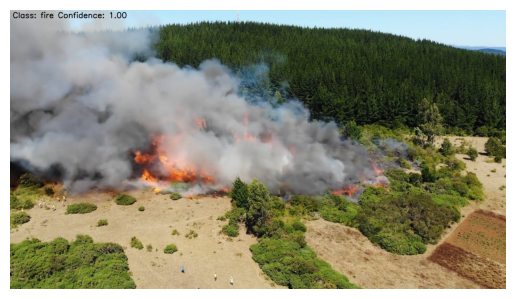


0: 224x224 fire 1.00, nofire 0.00, 24.9ms
Speed: 51.2ms preprocess, 24.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


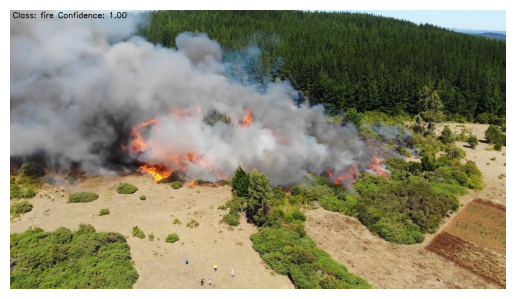


0: 224x224 fire 1.00, nofire 0.00, 38.4ms
Speed: 50.9ms preprocess, 38.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


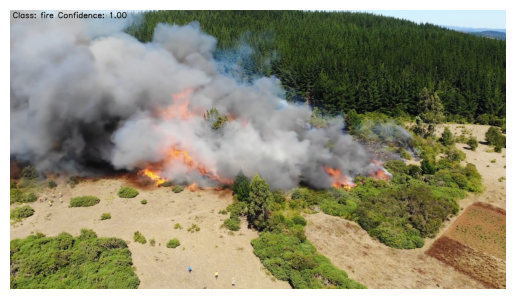


0: 224x224 fire 1.00, nofire 0.00, 56.1ms
Speed: 54.2ms preprocess, 56.1ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


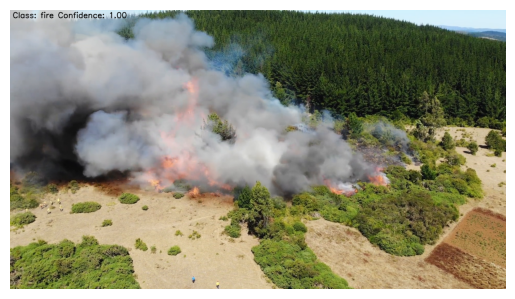


0: 224x224 fire 1.00, nofire 0.00, 24.8ms
Speed: 34.8ms preprocess, 24.8ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


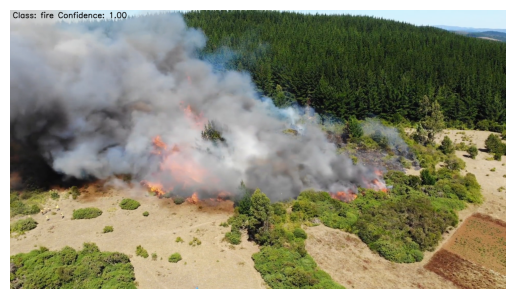


0: 224x224 fire 1.00, nofire 0.00, 27.6ms
Speed: 50.0ms preprocess, 27.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


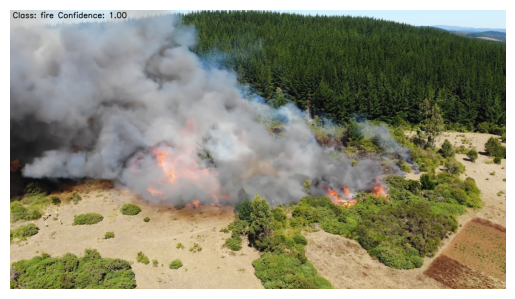


0: 224x224 fire 1.00, nofire 0.00, 25.3ms
Speed: 35.3ms preprocess, 25.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


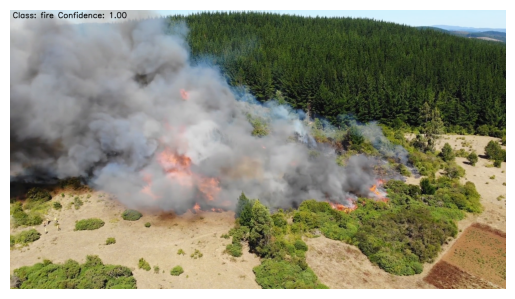

In [ ]:
predict_video(video2_fire['path'])


0: 224x224 fire 1.00, nofire 0.00, 28.2ms
Speed: 197.8ms preprocess, 28.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


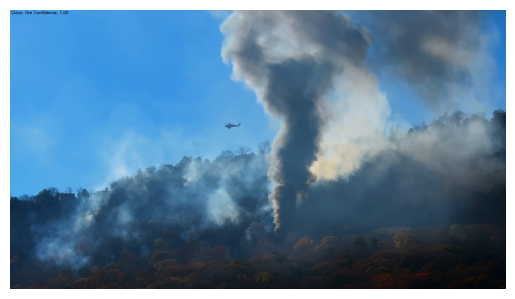


0: 224x224 fire 1.00, nofire 0.00, 16.4ms
Speed: 132.4ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


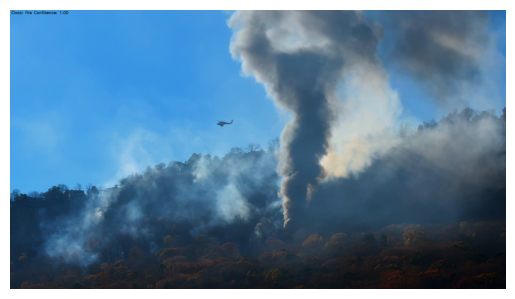


0: 224x224 fire 1.00, nofire 0.00, 22.0ms
Speed: 108.8ms preprocess, 22.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


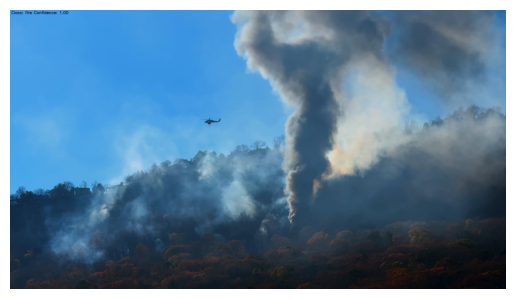


0: 224x224 fire 1.00, nofire 0.00, 17.1ms
Speed: 120.9ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


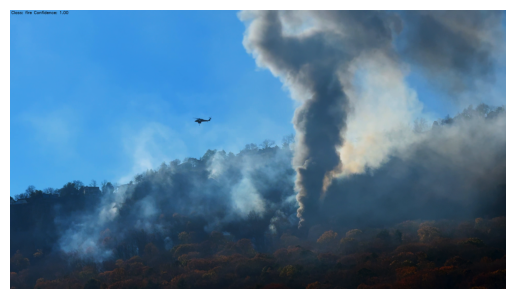


0: 224x224 fire 1.00, nofire 0.00, 17.4ms
Speed: 96.2ms preprocess, 17.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


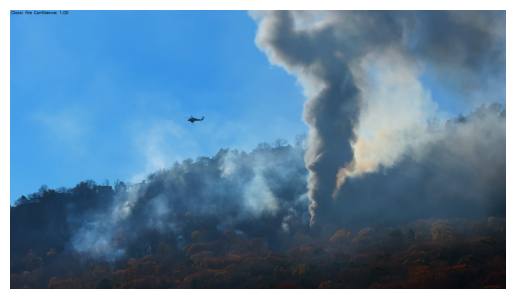


0: 224x224 fire 1.00, nofire 0.00, 16.6ms
Speed: 74.8ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


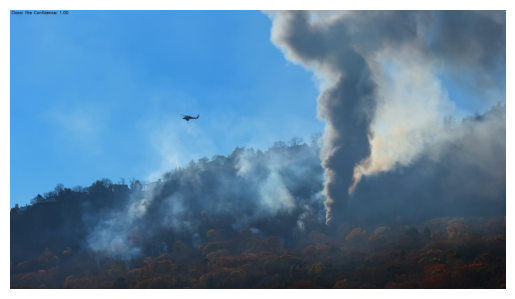


0: 224x224 fire 1.00, nofire 0.00, 25.2ms
Speed: 151.1ms preprocess, 25.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


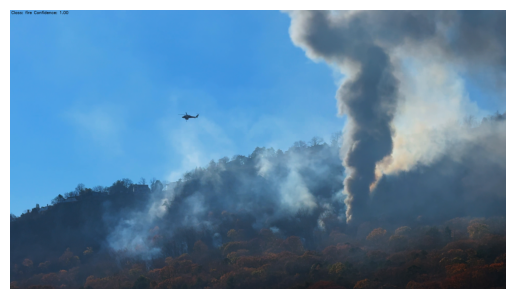


0: 224x224 fire 1.00, nofire 0.00, 16.7ms
Speed: 105.4ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


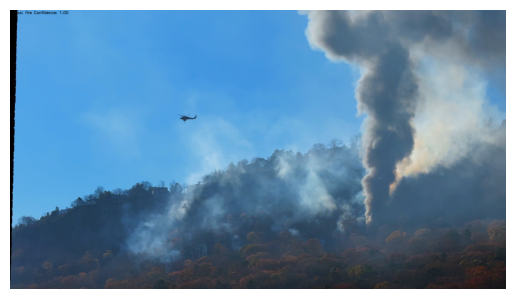


0: 224x224 fire 1.00, nofire 0.00, 16.1ms
Speed: 101.4ms preprocess, 16.1ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


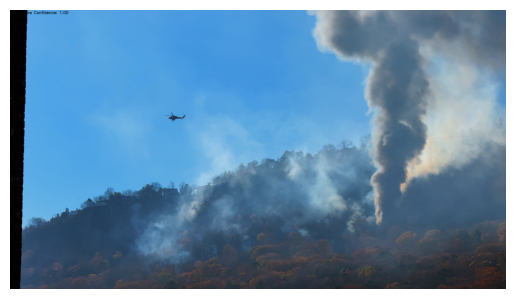


0: 224x224 fire 1.00, nofire 0.00, 16.0ms
Speed: 123.4ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


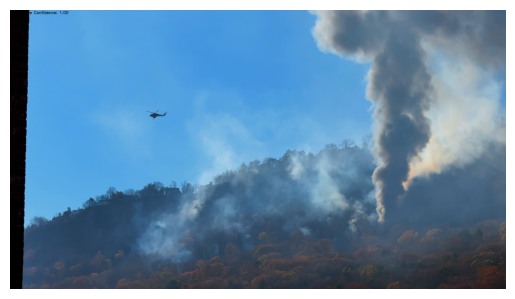


0: 224x224 fire 1.00, nofire 0.00, 25.2ms
Speed: 106.0ms preprocess, 25.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


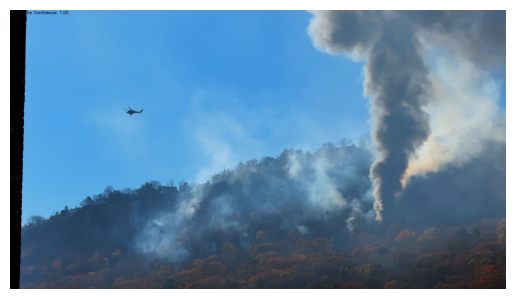


0: 224x224 fire 1.00, nofire 0.00, 16.4ms
Speed: 96.2ms preprocess, 16.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


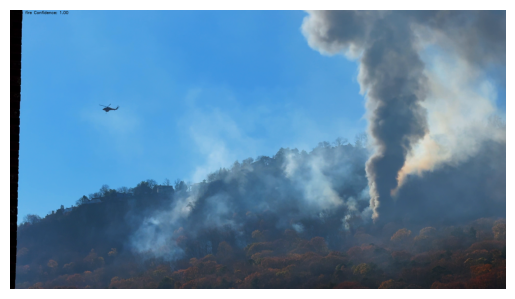


0: 224x224 fire 1.00, nofire 0.00, 24.9ms
Speed: 144.4ms preprocess, 24.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


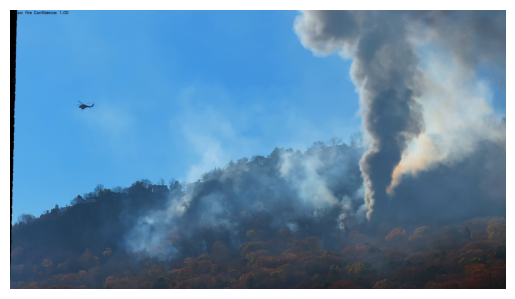


0: 224x224 fire 1.00, nofire 0.00, 28.0ms
Speed: 158.8ms preprocess, 28.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


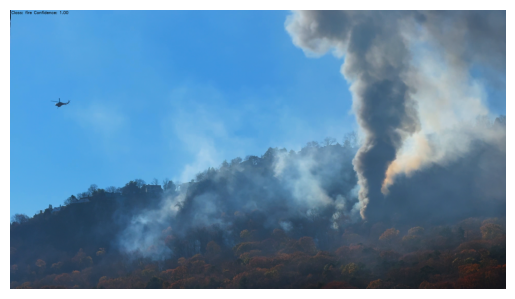


0: 224x224 fire 1.00, nofire 0.00, 20.2ms
Speed: 96.1ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Sure it is fire


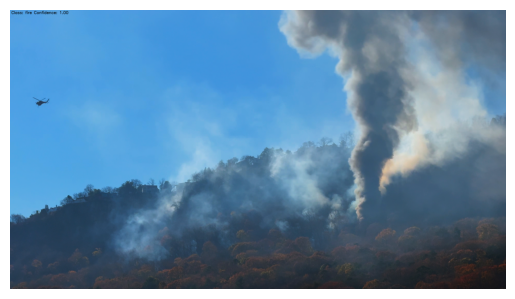

In [ ]:
predict_video(video3_fire['path'])

In [ ]:
predict_video(video1_nofire['path'])


0: 224x224 nofire 0.92, fire 0.08, 16.6ms
Speed: 33.2ms preprocess, 16.6ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 nofire 0.91, fire 0.09, 16.7ms
Speed: 57.9ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 nofire 0.87, fire 0.13, 24.6ms
Speed: 99.4ms preprocess, 24.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 nofire 0.89, fire 0.11, 30.6ms
Speed: 52.0ms preprocess, 30.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 nofire 0.91, fire 0.09, 24.6ms
Speed: 53.9ms preprocess, 24.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 nofire 0.86, fire 0.14, 16.5ms
Speed: 44.5ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 nofire 0.86, fire 0.14, 21.2ms
Speed: 51.4ms preprocess, 21.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

0: 224x224 n